# New York restaurant consumption analysis
New York restaurant location information, business status, customer flow, price and rating correlation analysis

### Import raw data

In [1]:
import pandas as pd 
import folium

In [2]:
data = pd.read_csv("/Users/moyang/Data-Visualization-on-Yelp-Data/Restaurant_df_1007.csv", index_col=0)

In [3]:
data.head()

,categories,coordinates,display_phone,distance,id,image_url,is_closed,location,name,phone,price,rating,review_count,transactions,url,cat
0,"[{'alias': 'shanghainese', 'title': 'Shanghain...","{'latitude': 40.7146691442891, 'longitude': -7...",(212) 233-8888,1066.508550,joes-shanghai-new-york-2,https://s3-media3.fl.yelpcdn.com/bphoto/ekUo5e...,False,"{'address1': '9 Pell St', 'address2': '', 'add...",Joe's Shanghai,1.212234e+10,$$,4.0,4696,[],https://www.yelp.com/biz/joes-shanghai-new-yor...,chinese
1,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...","{'latitude': 40.7142, 'longitude': -73.99787}",(212) 791-1817,1020.195988,tasty-hand-pulled-noodles-new-york,https://s3-media1.fl.yelpcdn.com/bphoto/3_3or7...,False,"{'address1': '1 Doyers St', 'address2': '', 'a...",Tasty Hand-Pulled Noodles,1.212791e+10,$,4.0,1280,"['delivery', 'pickup']",https://www.yelp.com/biz/tasty-hand-pulled-noo...,chinese
2,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...","{'latitude': 40.7422275387194, 'longitude': -7...",(212) 989-6699,4183.124416,buddakan-new-york,https://s3-media4.fl.yelpcdn.com/bphoto/Avw19V...,False,"{'address1': '75 9th Ave', 'address2': None, '...",Buddakan,1.212990e+10,$$$,4.0,3278,['restaurant_reservation'],https://www.yelp.com/biz/buddakan-new-york?adj...,chinese
3,"[{'alias': 'shanghainese', 'title': 'Shanghain...","{'latitude': 40.7598810063385, 'longitude': -7...",(718) 321-3838,14909.390990,nan-xiang-xiao-long-bao-flushing,https://s3-media4.fl.yelpcdn.com/bphoto/ONP2Dh...,False,"{'address1': '38-12 Prince St', 'address2': ''...",Nan Xiang Xiao Long Bao,1.718321e+10,$,4.0,2664,[],https://www.yelp.com/biz/nan-xiang-xiao-long-b...,chinese
4,"[{'alias': 'asianfusion', 'title': 'Asian Fusi...","{'latitude': 40.7190148, 'longitude': -73.9968...",(212) 334-3669,1524.985833,nyonya-new-york,https://s3-media2.fl.yelpcdn.com/bphoto/YuWC1G...,False,"{'address1': '199 Grand St', 'address2': '', '...",Nyonya,1.212334e+10,$$,4.0,1698,['delivery'],https://www.yelp.com/biz/nyonya-new-york?adjus...,chinese


### Extract latitude and longitude information and generate a new column

In [4]:
data['coordinates']

0       {'latitude': 40.7146691442891, 'longitude': -7...
1           {'latitude': 40.7142, 'longitude': -73.99787}
2       {'latitude': 40.7422275387194, 'longitude': -7...
3       {'latitude': 40.7598810063385, 'longitude': -7...
4       {'latitude': 40.7190148, 'longitude': -73.9968...
                              ...                        
5496    {'latitude': 40.8603060990572, 'longitude': -7...
5497    {'latitude': 40.7156225, 'longitude': -74.0073...
5498    {'latitude': 40.6357082, 'longitude': -74.1349...
5499     {'latitude': 40.81591, 'longitude': -73.9168399}
5500       {'latitude': 40.74225, 'longitude': -73.87199}
Name: coordinates, Length: 5501, dtype: object

In [5]:
import re
latitude=[]
longitude=[]
for coordinate in data['coordinates']:
    num = re.findall(r"[-+]?\d*\.\d+|\d+", coordinate)
    latitude.append(num[0])
    longitude.append(num[1])
list_df = pd.DataFrame({'latitude': latitude,
                        'longitude':longitude})
list_df

,latitude,longitude
0,40.7146691442891,-73.9977602206654
1,40.7142,-73.99787
2,40.7422275387194,-74.0047066478157
3,40.7598810063385,-73.8325853625656
4,40.7190148,-73.9968228
...,...,...
5496,40.8603060990572,-73.8908256590366
5497,40.7156225,-74.0073923
5498,40.6357082,-74.1349684
5499,40.81591,-73.9168399


### Merge two tables horizontally

In [6]:
new_df = pd.concat([data, list_df], axis=1)
new_df

,categories,coordinates,display_phone,distance,id,image_url,is_closed,location,name,phone,price,rating,review_count,transactions,url,cat,latitude,longitude
0,"[{'alias': 'shanghainese', 'title': 'Shanghain...","{'latitude': 40.7146691442891, 'longitude': -7...",(212) 233-8888,1066.508550,joes-shanghai-new-york-2,https://s3-media3.fl.yelpcdn.com/bphoto/ekUo5e...,False,"{'address1': '9 Pell St', 'address2': '', 'add...",Joe's Shanghai,1.212234e+10,$$,4.0,4696,[],https://www.yelp.com/biz/joes-shanghai-new-yor...,chinese,40.7146691442891,-73.9977602206654
1,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...","{'latitude': 40.7142, 'longitude': -73.99787}",(212) 791-1817,1020.195988,tasty-hand-pulled-noodles-new-york,https://s3-media1.fl.yelpcdn.com/bphoto/3_3or7...,False,"{'address1': '1 Doyers St', 'address2': '', 'a...",Tasty Hand-Pulled Noodles,1.212791e+10,$,4.0,1280,"['delivery', 'pickup']",https://www.yelp.com/biz/tasty-hand-pulled-noo...,chinese,40.7142,-73.99787
2,"[{'alias': 'chinese', 'title': 'Chinese'}, {'a...","{'latitude': 40.7422275387194, 'longitude': -7...",(212) 989-6699,4183.124416,buddakan-new-york,https://s3-media4.fl.yelpcdn.com/bphoto/Avw19V...,False,"{'address1': '75 9th Ave', 'address2': None, '...",Buddakan,1.212990e+10,$$$,4.0,3278,['restaurant_reservation'],https://www.yelp.com/biz/buddakan-new-york?adj...,chinese,40.7422275387194,-74.0047066478157
3,"[{'alias': 'shanghainese', 'title': 'Shanghain...","{'latitude': 40.7598810063385, 'longitude': -7...",(718) 321-3838,14909.390990,nan-xiang-xiao-long-bao-flushing,https://s3-media4.fl.yelpcdn.com/bphoto/ONP2Dh...,False,"{'address1': '38-12 Prince St', 'address2': ''...",Nan Xiang Xiao Long Bao,1.718321e+10,$,4.0,2664,[],https://www.yelp.com/biz/nan-xiang-xiao-long-b...,chinese,40.7598810063385,-73.8325853625656
4,"[{'alias': 'asianfusion', 'title': 'Asian Fusi...","{'latitude': 40.7190148, 'longitude': -73.9968...",(212) 334-3669,1524.985833,nyonya-new-york,https://s3-media2.fl.yelpcdn.com/bphoto/YuWC1G...,False,"{'address1': '199 Grand St', 'address2': '', '...",Nyonya,1.212334e+10,$$,4.0,1698,['delivery'],https://www.yelp.com/biz/nyonya-new-york?adjus...,chinese,40.7190148,-73.9968228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5496,"[{'alias': 'mexican', 'title': 'Mexican'}, {'a...","{'latitude': 40.8603060990572, 'longitude': -7...",(718) 220-1276,19295.845240,chipotle-mexican-grill-bronx-2,https://s3-media1.fl.yelpcdn.com/bphoto/Fk_bZ5...,False,"{'address1': '4760 Third Ave', 'address2': '',...",Chipotle Mexican Grill,1.718220e+10,$$,2.5,39,[],https://www.yelp.com/biz/chipotle-mexican-gril...,mexican,40.8603060990572,-73.8908256590366
5497,"[{'alias': 'mexican', 'title': 'Mexican'}]","{'latitude': 40.7156225, 'longitude': -74.0073...",(212) 393-1026,1581.060316,taco-house-new-york-5,https://s3-media2.fl.yelpcdn.com/bphoto/a8M53d...,False,"{'address1': '178 Church St', 'address2': '', ...",Taco House,1.212393e+10,$,2.5,77,"['delivery', 'pickup']",https://www.yelp.com/biz/taco-house-new-york-5...,mexican,40.7156225,-74.0073923
5498,"[{'alias': 'mexican', 'title': 'Mexican'}]","{'latitude': 40.6357082, 'longitude': -74.1349...",(718) 273-2442,14173.570510,taqueria-la-roqueta-staten-island,https://s3-media3.fl.yelpcdn.com/bphoto/yjVPya...,False,"{'address1': '226 Port Richmond Ave', 'address...",Taqueria La Roqueta,1.718273e+10,$,4.5,2,[],https://www.yelp.com/biz/taqueria-la-roqueta-s...,mexican,40.6357082,-74.1349684
5499,"[{'alias': 'mexican', 'title': 'Mexican'}, {'a...","{'latitude': 40.81591, 'longitude': -73.9168399}",(718) 665-3336,13913.817000,delicioso-restaurant-bronx,https://s3-media2.fl.yelpcdn.com/bphoto/q38BDr...,False,"{'address1': '423 E 149th St', 'address2': '',...",Delicioso Restaurant,1.718665e+10,$,3.5,13,"['delivery', 'pickup']",https://www.yelp.com/biz/delicioso-restaurant-...,mexican,40.81591,-73.9168399


### Show the restaurant’s name and URL on the map

In [7]:
map_yelp = folium.Map(location=[40.74220,-73.72100],zoom_start=10)
for lat,lng,name,url in zip(new_df['latitude'].astype(float),new_df['longitude'].astype(float),new_df['name'],new_df['url']):
    label = '{}, {}'.format(name, url)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    radius=5,
    popup=label,
    color='green',
    fill=True,
    fill_color='#3186cc',
    fill_opacity=0.7,
    parse_html=False).add_to(map_yelp)
map_yelp

### Clustering on the map according to whether it is closed

In [8]:
from folium import plugins
# let's start again with a clean copy of the map of New York City
san_map = folium.Map(location = [40.74220,-73.72100], zoom_start = 10)
new_df['latitude'] = new_df['latitude'].astype(float)
new_df['longitude'] = new_df['longitude'].astype(float)
new_df['latitude'] = new_df['latitude'].astype(float)
new_df['is_closed'] = new_df['is_closed'].astype(str)
new_df1 = new_df.dropna(axis=0, subset=['latitude','longitude','is_closed'])

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(san_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(new_df1.latitude, new_df1.longitude, new_df1.is_closed):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# add incidents to map
san_map.add_child(incidents)

### Draw a heat map on the map according to the number of reviews

In [9]:
from folium import plugins
from folium.plugins import HeatMap

new_df['latitude'] = new_df['latitude'].astype(float)
new_df['longitude'] = new_df['longitude'].astype(float)
new_df['review_count'] = new_df['review_count'].astype(float)

heat_df = new_df[['latitude', 'longitude', 'review_count']]
heat_df = heat_df.dropna(axis=0, subset=['latitude','longitude','review_count'])

heat_data = [[row['latitude'],row['longitude'],row['review_count']] for index, row in heat_df.iterrows()]

heatmap_city = folium.Map(location=[40.74220,-73.72100],zoom_start=10)

folium.TileLayer('cartodbpositron').add_to(heatmap_city) #cartodbpositron cartodbdark_matter
HeatMap(heat_data).add_to(heatmap_city)

# add the workplace marker
# folium.Marker(
#     [40.74220,-73.72100],
#     radius=5,
#     tooltip='Workplace',
#     icon=folium.Icon(icon='briefcase', color="green")
# ).add_to(heatmap_city)

# add the 5km radius
# folium.Circle([40.74220,-73.72100],
#                     radius=5000,
#                     color='red'
#                    ).add_to(heatmap_city)

heatmap_city

### Plot average rating and price by categories

In [18]:
import pygal as pg
from pygal.style import DarkStyle, NeonStyle, BlueStyle, DarkGreenStyle, LightColorizedStyle
new_df['price'] = new_df['price'].str.len()
index = ['cat', 'price', 'rating']
clean_data = new_df[index]
avg_data = clean_data.groupby('cat').mean()
avg_data

,price,rating
cat,,
chinese,1.550321,3.626000
french,2.446875,3.697740
indpak,1.707724,3.279675
italian,2.153374,3.936500
japanese,2.079872,3.665000
korean,1.900232,3.468985
mexican,1.550931,3.670000


In [24]:
from pygal.style import Style
# Interactive Bar Chart
custom_style = Style(label_font_size = 15.0, major_label_font_size = 15)

ibar_chart = pg.Bar(x_title = 'Restaurant Categories',style = custom_style)
ibar_chart.title = 'Restarants'
ibar_chart.x_labels = ['Chinese', 'French', 'Indian', 'Italian', 'Japanese', 'Korean', 'Mexican']


for cols in avg_data.columns:
    ibar_chart.add(cols,avg_data[cols])

#galplot(ibar_chart)   ### display pygal in Jupyter notebook


ibar_chart.render_to_file('chart.svg')

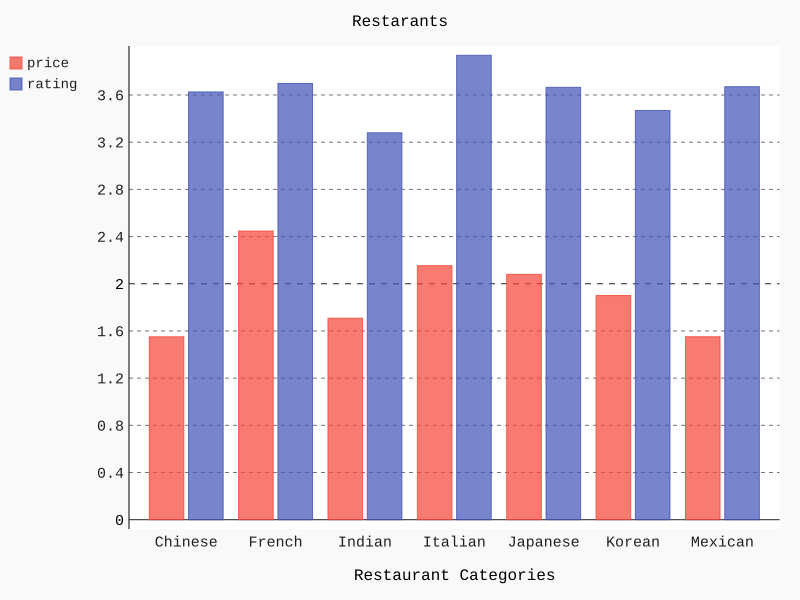

In [25]:
from IPython.display import SVG, display
display(SVG(ibar_chart.render(disable_xml_declaration=True)))
#display({'image/svg+xml': ibar_chart.render()}, raw=True)

### SolidGauge

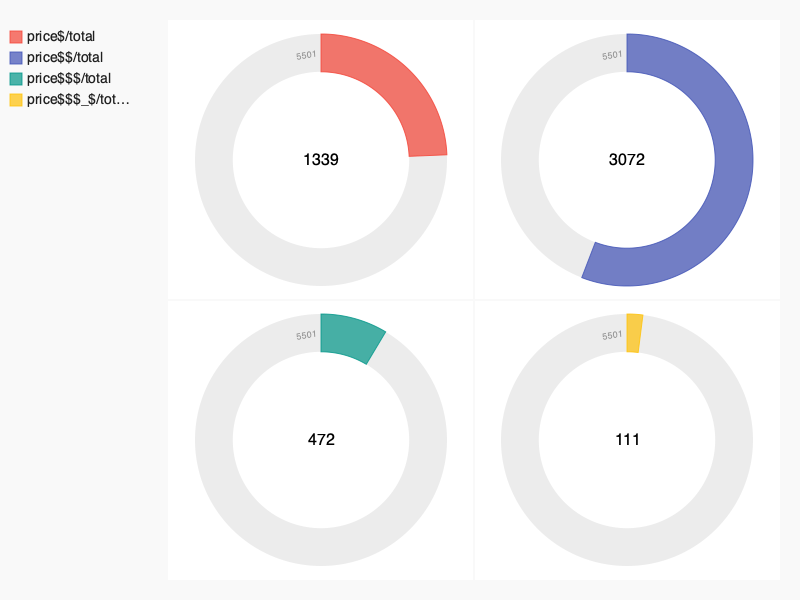

In [26]:
clean_data.groupby(['rating']).size()
gauge = pg.SolidGauge(inner_radius=0.70)


gauge.add('price$/total', [{'value': 1339, 'max_value':5501}])
gauge.add('price$$/total', [{'value': 3072, 'max_value': 5501}])
gauge.add('price$$$/total', [{'value': 472, 'max_value': 5501}])
gauge.add('price$$$_$/total', [{'value': 111, 'max_value': 5501}])

### Average Price by Categories by rating

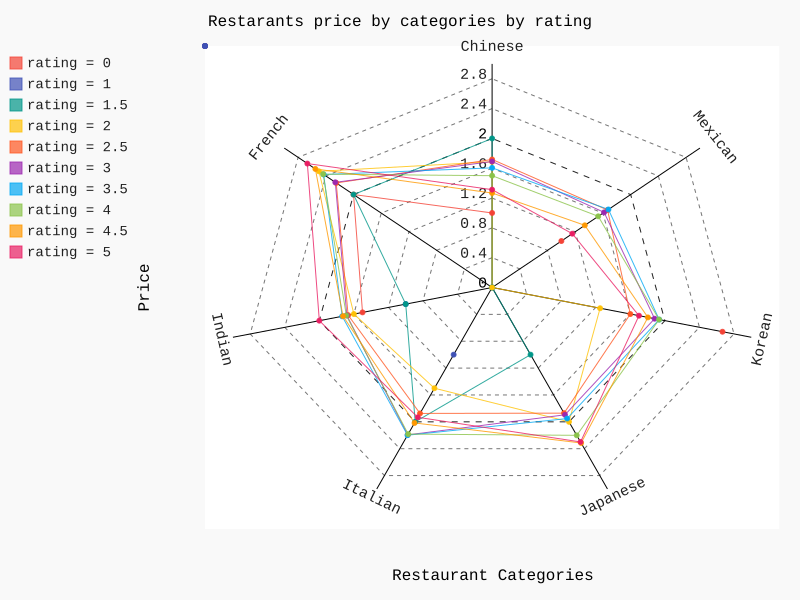

In [27]:
new = clean_data.drop([2839,3615], axis = 0)


p_cr=new['price'].groupby([new['cat'],new['rating']]).mean()
p_cr = pd.DataFrame(p_cr)
p_cr = p_cr.reset_index(level = ['cat', 'rating'])
# p_cr[head]
custom_style = Style(label_font_size = 15.0, major_label_font_size = 15)

bar_chart = pg.Radar(x_title = 'Restaurant Categories', y_title = 'Price', style = custom_style, range=(0, 3))
bar_chart.title = 'Restarants price by categories by rating'
bar_chart.x_labels = ['Chinese', 'French', 'Indian', 'Italian', 'Japanese', 'Korean', 'Mexican']


bar_chart.add('rating = 0',list(p_cr[p_cr['rating'] == 0].price))
bar_chart.add('rating = 1',list(p_cr[p_cr['rating'] == 1].price)) 
bar_chart.add('rating = 1.5',list(p_cr[p_cr['rating'] == 1.5].price))  
bar_chart.add('rating = 2',list(p_cr[p_cr['rating'] == 2].price))
bar_chart.add('rating = 2.5',list(p_cr[p_cr['rating'] == 2.5].price))
bar_chart.add('rating = 3',list(p_cr[p_cr['rating'] == 3].price))
bar_chart.add('rating = 3.5',list(p_cr[p_cr['rating'] == 3.5].price))
bar_chart.add('rating = 4',list(p_cr[p_cr['rating'] == 4].price))
bar_chart.add('rating = 4.5',list(p_cr[p_cr['rating'] == 4.5].price))
bar_chart.add('rating = 5',list(p_cr[p_cr['rating'] == 5].price))


#galplot(bar_chart) 
display(SVG(bar_chart.render(disable_xml_declaration=True)))